# **YOLO-Worldv2:**

In [1]:
!nvidia-smi

Mon Apr 15 18:52:54 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install -U -q ultralytics supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.4/750.4 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 kB 8.2 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [4]:
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/digits_original_crops.zip
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/glyphs_original_crops.zip

In [5]:
from ultralytics import YOLOWorld
from supervision import Detections, DetectionDataset, InferenceSlicer, BoxAnnotator, MaskAnnotator, plot_image
from supervision.draw.color import Color, ColorPalette
from PIL import Image
import numpy as np
import cv2
!yolo checks

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.5/201.2 GB disk)

OS                  Linux-6.1.58+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.00GHz
CUDA                12.1

matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.2.1+cu121>=1.8.0
torchvision         ✅ 0.17.1+cu121>=0.9.0
tqdm                ✅ 4.66.2>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1
pandas              ✅ 2.0.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0


## Digits:

In [30]:
digits_model = YOLOWorld("yolov8l-worldv2.pt")
digits_model.set_classes(["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"])

In [31]:
digits_model_test_metrics = digits_model.val(data="/content/digits_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-worldv2 summary: 522 layers, 198085235 parameters, 152147299 gradients, 178.2 GFLOPs


val: Scanning /content/digits_original_crops/test/labels.cache... 451 images, 0 backgrounds, 0 corrupt: 100%|██████████| 451/451 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:25<00:00,  1.16it/s]


                   all        451       6188   0.000127   0.000265   6.39e-05   1.92e-05
                     0        451        571          0          0          0          0
                     1        451       1111          0          0          0          0
                     2        451        629          0          0          0          0
                     3        451       1120          0          0          0          0
                     4        451        531          0          0          0          0
                     5        451        433          0          0          0          0
                     6        451        475          0          0          0          0
                     7        451        449          0          0          0          0
                     8        451        492          0          0          0          0
                     9        451        377    0.00127    0.00265   0.000639   0.000192
Speed: 1.0ms preproce

In [40]:
digits_model = YOLOWorld("/content/drive/MyDrive/DP/VEGA/weights/yolo_world_v2_digits_best.pt")

In [41]:
digits_model_test_metrics = digits_model.val(data="/content/digits_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-worldv2 summary (fused): 295 layers, 46807922 parameters, 0 gradients, 178.2 GFLOPs


val: Scanning /content/digits_original_crops/test/labels.cache... 451 images, 0 backgrounds, 0 corrupt: 100%|██████████| 451/451 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:30<00:00,  1.05s/it]


                   all        451       6188      0.977      0.984      0.989      0.843
                     0        451        571      0.984      0.989      0.992      0.849
                     1        451       1111      0.981       0.99      0.993       0.85
                     2        451        629      0.975      0.977      0.989      0.822
                     3        451       1120      0.978      0.995      0.986      0.853
                     4        451        531      0.972      0.979      0.989      0.845
                     5        451        433       0.96       0.99      0.983      0.846
                     6        451        475      0.981      0.972      0.988       0.86
                     7        451        449      0.988      0.987      0.994      0.812
                     8        451        492      0.982      0.976      0.988      0.824
                     9        451        377      0.969      0.983      0.987      0.867
Speed: 1.7ms preproce


0: 640x640 6 0s, 7 1s, 2 2s, 6 3s, 3 4s, 1 5, 4 7s, 1 8, 1 9, 67.5ms
Speed: 2.0ms preprocess, 67.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


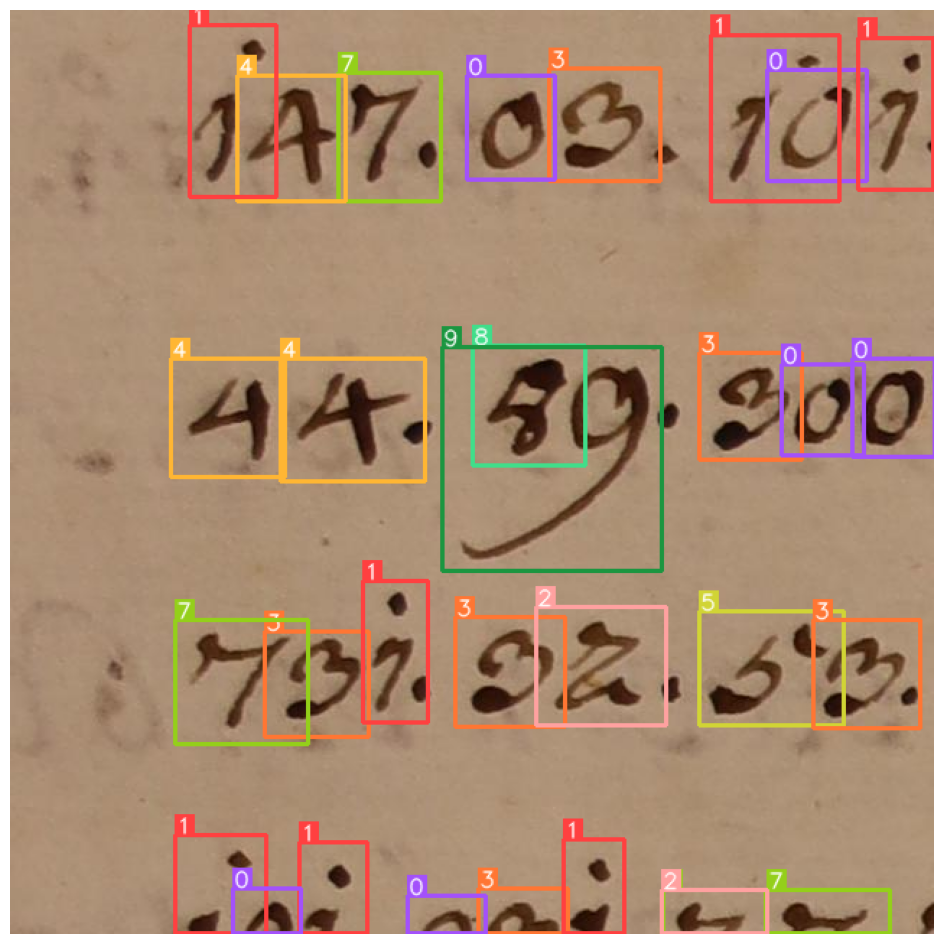

In [9]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg")
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg"),
    detections=digits_detections
)
digits_annotated_array = MaskAnnotator().annotate(
    scene=digits_annotated_array,
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x2144 18 0s, 35 1s, 11 2s, 44 3s, 52 4s, 12 5s, 58 6s, 8 7s, 39 8s, 23 9s, 669.4ms
Speed: 104.0ms preprocess, 669.4ms inference, 94.6ms postprocess per image at shape (1, 3, 3200, 2144)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


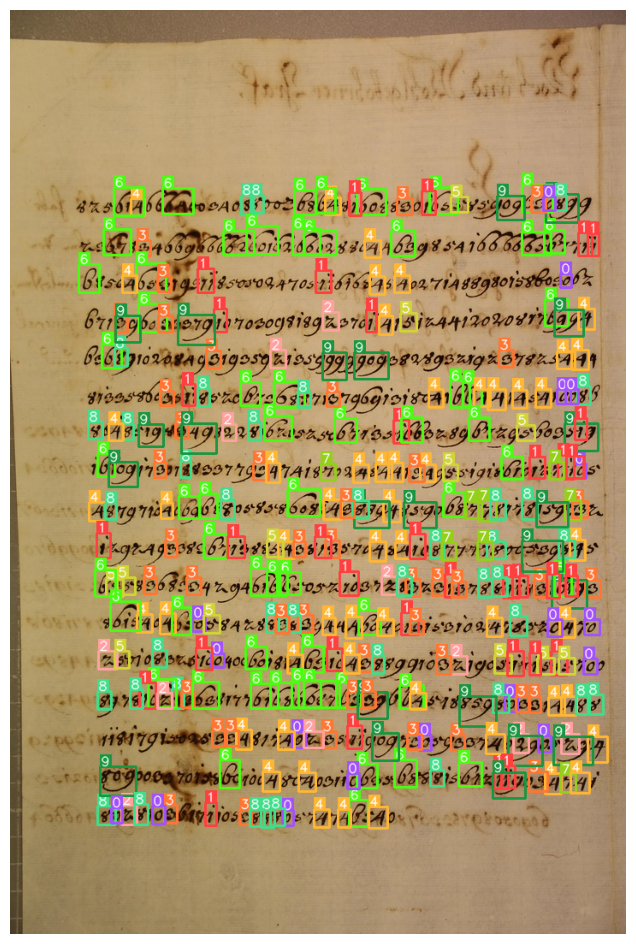

In [10]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x2400 3 0s, 27 1s, 14 2s, 17 3s, 30 4s, 10 5s, 9 7s, 25 9s, 781.2ms
Speed: 164.0ms preprocess, 781.2ms inference, 1.8ms postprocess per image at shape (1, 3, 3200, 2400)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


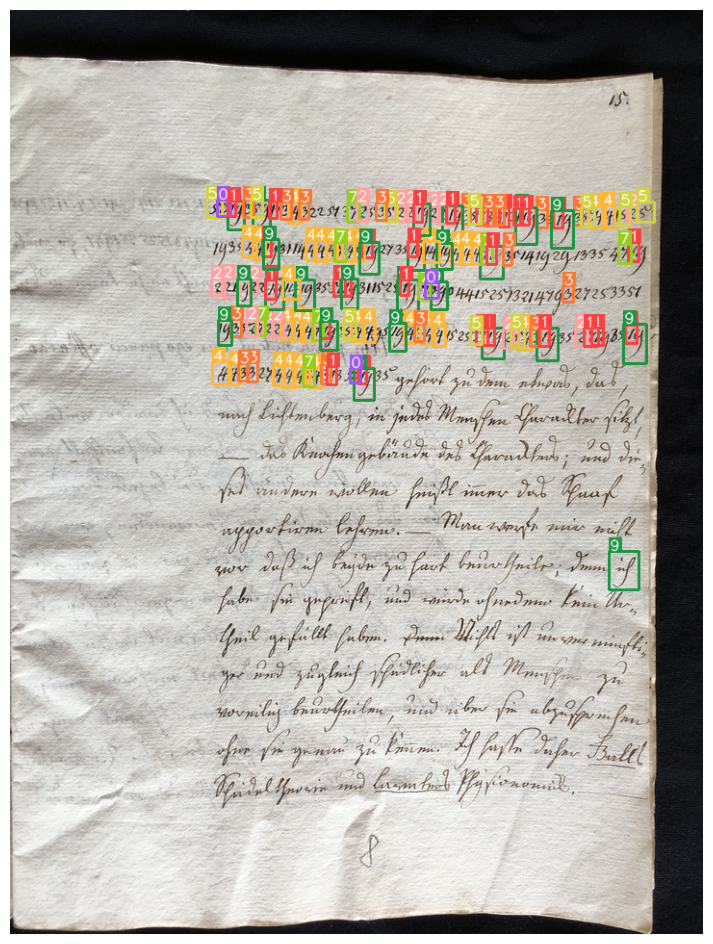

In [11]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)

## SAHI Digits:

In [12]:
def digits_model_callback(x: np.ndarray) -> Detections:
    result = digits_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [13]:
digits_sahi_model = InferenceSlicer(
    callback=digits_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


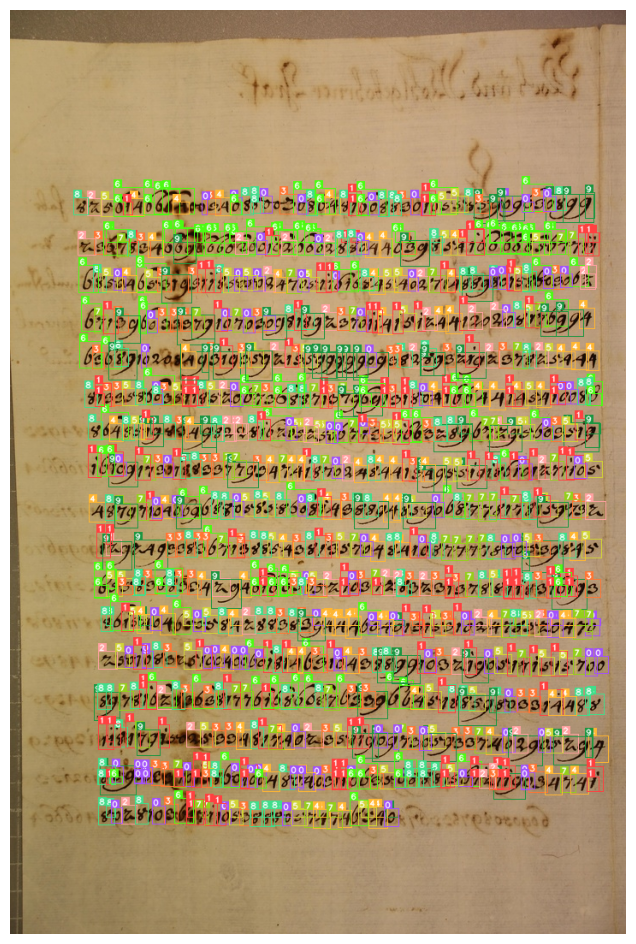

In [15]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


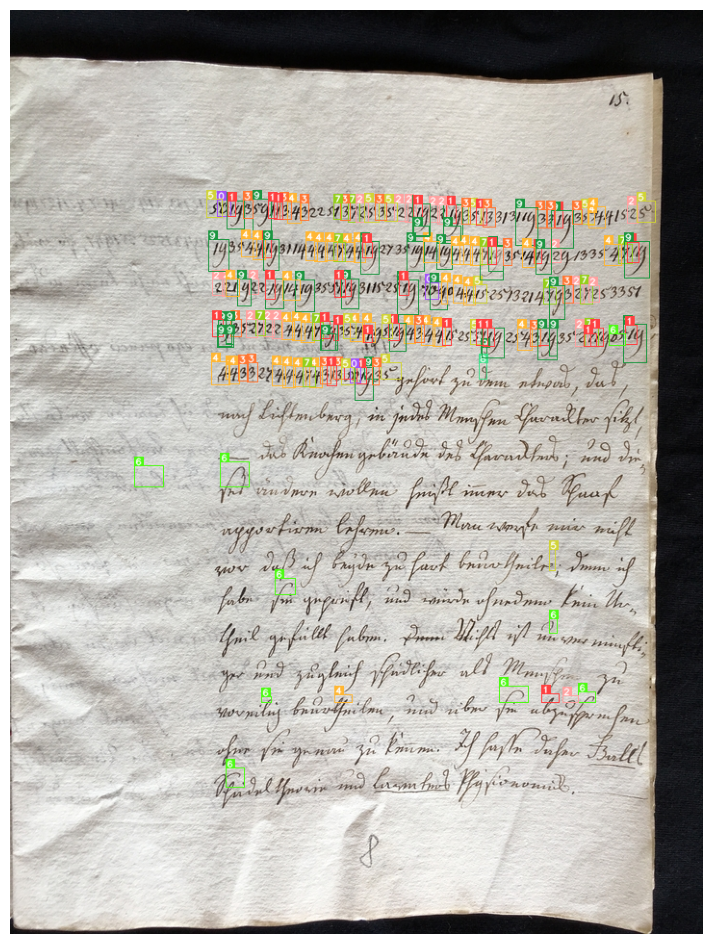

In [16]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

## Glyphs:

In [42]:
glyphs_model = YOLOWorld("yolov8l-worldv2.pt")

In [43]:
glyphs_model.set_classes(['N', 'Q', 'R', 'W', 'Z - -', 'Z - I', 'Z', 'u0023', 'u002a', 'u003d', 'u0043', 'u0054', 'u006d', 'u00d8', 'u0186', 'u01c2 - -', 'u01c2', 'u01c3', 'u0223', 'u0236 - - -', 'u0236 - -', 'u0236', 'u0255', 'u0266', 'u0271 - I', 'u0271', 'u0273', 'u0293', 'u0294', 'u0295', 'u0391', 'u039b', 'u03a5', 'u03a9', 'u03b1', 'u03b2', 'u03b8', 'u03ba', 'u03bb', 'u03c0 D _', 'u03c0', 'u03c6', 'u03c7 - -', 'u03c7', 'u03c9', 'u03f4', 'u03fe', 'u03ff', 'u04ba', 'u0564', 'u06ba - -', 'u06ba', 'u07c2', 'u0ba3', 'u0ce7 - -', 'u0ce7', 'u0e87 - - - -', 'u0e87 - - -', 'u0e87 - -', 'u0e87', 'u0ebd - -', 'u0ebd', 'u10c5', 'u10dd', 'u13ce', 'u1433', 'u146b', 'u1472 U -', 'u1472', 'u1542', 'u1543', 'u1546', 'u166d', 'u1687', 'u1691', 'u1692', 'u1722', 'u1723', 'u1d13', 'u1d133', 'u1d15f R -', 'u1d48', 'u1d78f', 'u1dc9', 'u1f74b', 'u1f75e', 'u1f761', 'u1f76a', 'u2020', 'u2026', 'u20df D I', 'u20df U I', 'u20df', 'u2113', 'u2118', 'u2125', 'u2164', 'u2200', 'u221e - -', 'u221e', 'u2290', 'u2293', 'u2295', 'u22a1', 'u22a5', 'u22b8 L I', 'u231c', 'u231d', 'u2571 R - - -', 'u2571 R - -', 'u2571 R -', 'u25a1', 'u25b3 - _', 'u25b3', 'u25eb', 'u25ec', 'u25ef', 'u2609 D I I I', 'u2609 L - R -', 'u2609 U I I I', 'u2609 U I _ I', 'u2609', 'u260a', 'u263E', 'u263f', 'u2640', 'u2641', 'u2642', 'u2644', 'u2648', 'u264b', 'u264d', 'u2650', 'u2651', 'u2652', 'u26bb', 'u26db', 'u2723', 'u2733', 'u27c6', 'u27d2', 'u27dc R I', 'u27dc', 'u2909', 'u29b5', 'u29b6', 'u29df - I', 'u29df', 'u2a4b', 'u2a68', 'u2ad8', 'u2aef - I', 'u2aef', 'u2af0', 'u2b35', 'u2caf', 'u2cc0 - -', 'u2cc0', 'u3059', 'ua609', 'ua72b', 'ufeea'])
glyphs_model_test_metrics = glyphs_model.val(data="/content/glyphs_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-worldv2 summary: 522 layers, 198085235 parameters, 152147299 gradients, 234.0 GFLOPs


val: Scanning /content/glyphs_original_crops/test/labels.cache... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 102/102 [01:24<00:00,  1.21it/s]


                   all       1627       3656     0.0031       0.37    0.00446     0.0031
                     N       1627         21          0          0          0          0
                     Q       1627         23      0.021      0.304     0.0164     0.0107
                     R       1627         19          0          0          0          0
                     W       1627         22          0          0          0          0
                 Z - -       1627         27      0.012      0.222    0.00761    0.00532
                 Z - I       1627         27    0.00382      0.741    0.00511    0.00322
                     Z       1627         24          0          0          0          0
                 u0023       1627         19          0          0          0          0
                 u002a       1627         24   0.000786     0.0417   0.000409   0.000286
                 u003d       1627         25    0.00327       0.16    0.00207    0.00135
                 u004

In [44]:
glyphs_model = YOLOWorld("/content/drive/MyDrive/DP/VEGA/weights/yolo_world_v2_glyphs_best.pt")

In [45]:
glyphs_model_test_metrics = glyphs_model.val(data="/content/glyphs_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-worldv2 summary (fused): 295 layers, 46807922 parameters, 0 gradients, 234.0 GFLOPs


val: Scanning /content/glyphs_original_crops/test/labels.cache... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 102/102 [01:18<00:00,  1.30it/s]


                   all       1627       3656      0.972      0.983      0.989       0.98
                     N       1627         21      0.981          1      0.995      0.995
                     Q       1627         23      0.998          1      0.995      0.995
                     R       1627         19      0.946          1      0.993      0.982
                     W       1627         22      0.997          1      0.995      0.995
                 Z - -       1627         27      0.986          1      0.995      0.988
                 Z - I       1627         27          1      0.828      0.995      0.983
                     Z       1627         24      0.997          1      0.995      0.988
                 u0023       1627         19      0.975          1      0.995      0.912
                 u002a       1627         24      0.968      0.958      0.992      0.886
                 u003d       1627         25      0.994          1      0.995       0.99
                 u004


0: 640x640 1 u0023, 1 u002a, 1 u0043, 1 u0186, 1 u0223, 1 u03a5, 1 u03c0, 1 u0564, 1 u25a1, 69.4ms
Speed: 2.1ms preprocess, 69.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


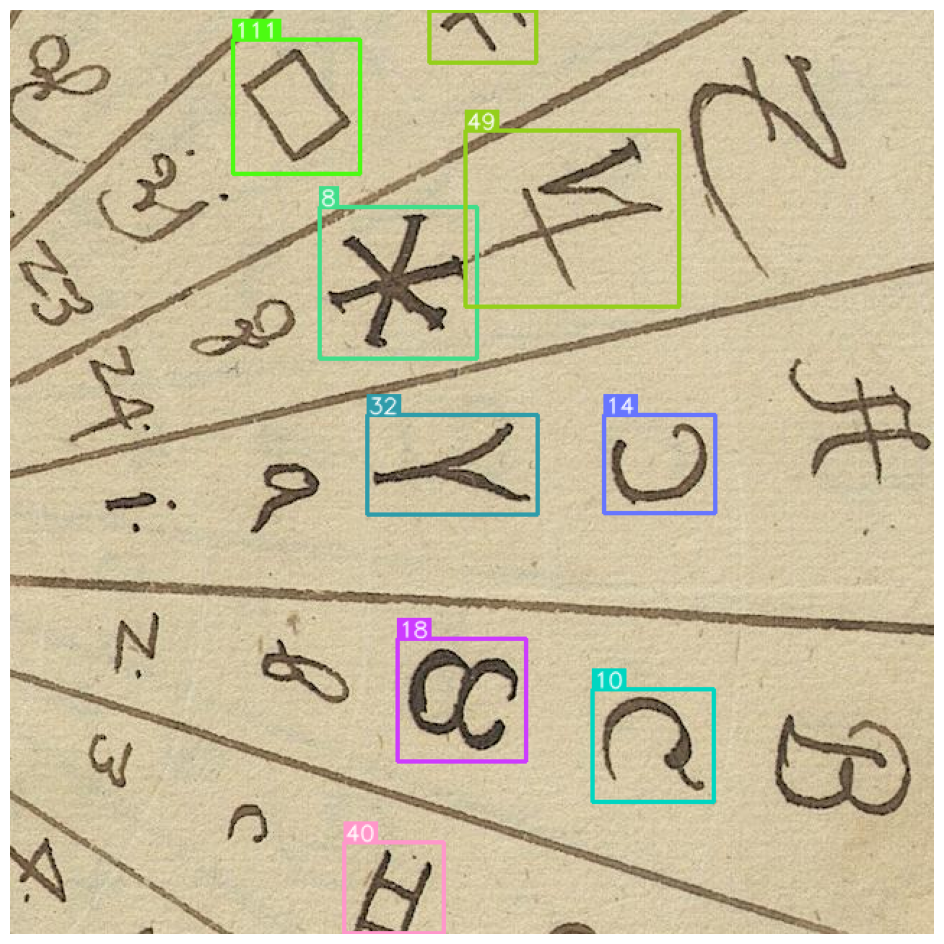

In [25]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg")
    )[0]
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg"),
    detections=glyphs_detections
)
glyphs_annotated_array = MaskAnnotator().annotate(
    scene=glyphs_annotated_array,
    detections=glyphs_detections
)
plot_image(glyphs_annotated_array)


0: 3200x2144 1 Z - -, 1 u0023, 1 u002a, 1 u003d, 2 u0043s, 1 u0186, 2 u01c2 - -s, 1 u0271 - I, 1 u0271, 1 u0293, 2 u0294s, 1 u03a5, 1 u03c0, 2 u03c9s, 1 u03ff, 1 u0564, 1 u06ba - -, 1 u06ba, 2 u0ce7 - -s, 1 u0ce7, 1 u0ebd - -, 2 u1542s, 1 u1543, 1 u1546, 1 u1dc9, 1 u1f75e, 1 u2020, 1 u25a1, 1 u25b3 - _, 1 u25ef, 3 u2609 D I I Is, 1 u263E, 1 u263f, 1 u2640, 1 u2642, 1 u2644, 1 u264b, 1 u264d, 1 u2652, 1 u27dc R I, 1 u29df - I, 1 u2ad8, 1 u2aef - I, 1 u2af0, 746.4ms
Speed: 44.0ms preprocess, 746.4ms inference, 1.9ms postprocess per image at shape (1, 3, 3200, 2144)


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


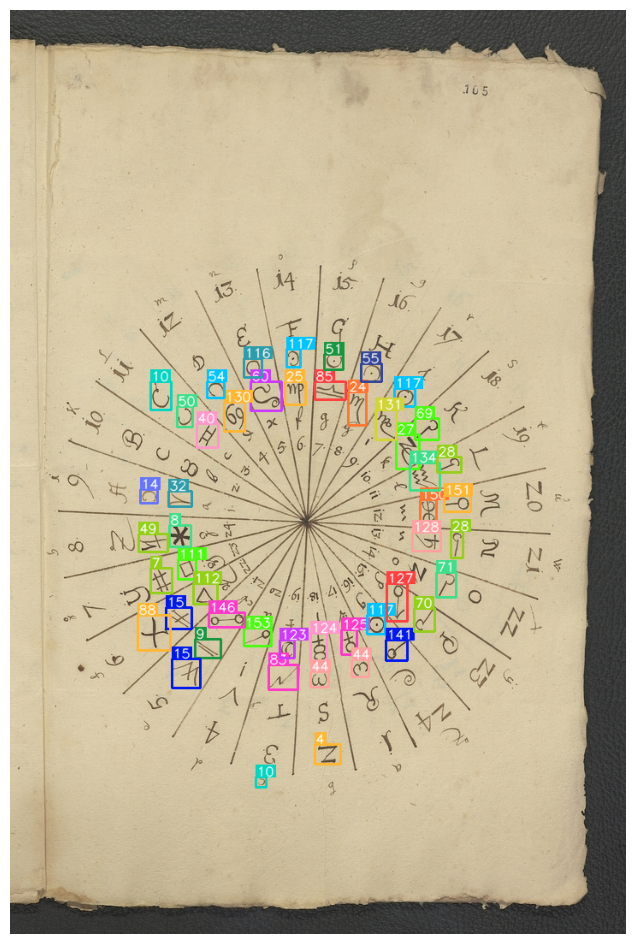

In [26]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
        imgsz=3200
    )[0]
)

glpyhs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_detections
)
plot_image(glpyhs_annotated_array)

## SAHI Glyphs:

In [27]:
def glyphs_model_callback(x: np.ndarray) -> Detections:
    result = glyphs_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [28]:
glyphs_sahi_model = InferenceSlicer(
    callback=glyphs_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


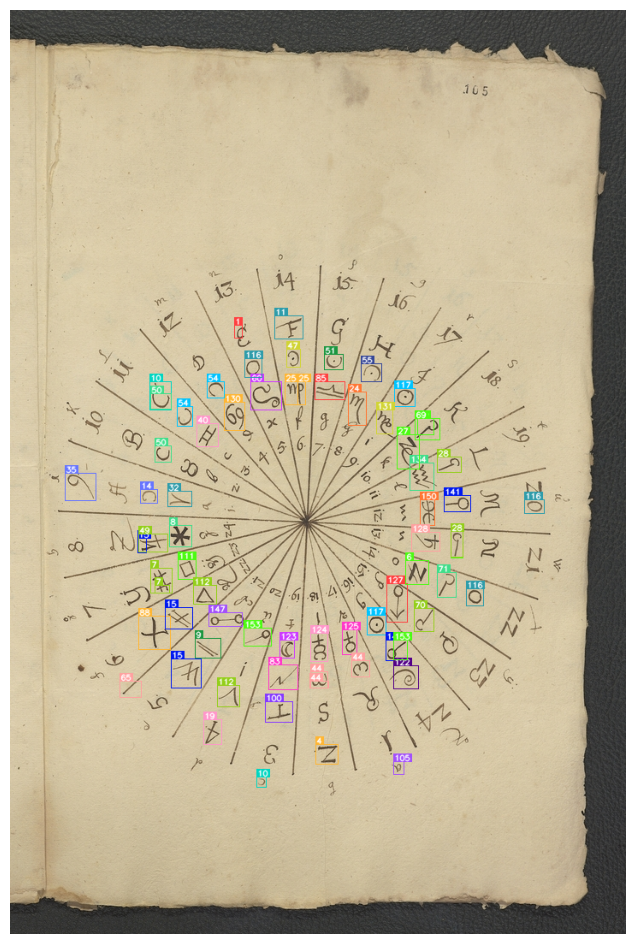

In [29]:
glyphs_sahi_detections = glyphs_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_sahi_detections
)
plot_image(glyphs_annotated_array)